In [1]:
import pandas as pd
import numpy as np
import json
import re 
import sys
import itertools

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt


import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth
import spotipy.util as util

import warnings
warnings.filterwarnings("ignore")

In [2]:
%matplotlib inline

# Data Exploration and Preperation

In [3]:
tracks_df = pd.read_csv('datasets/tracks.csv')
tracks_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,0,-13.338,1,0.4510,0.674,0.7440,0.151,0.127,104.851,3
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,0,-22.136,1,0.9570,0.797,0.0000,0.148,0.655,102.009,1
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,1,-21.180,1,0.0512,0.994,0.0218,0.212,0.457,130.418,5
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,7,-27.961,1,0.0504,0.995,0.9180,0.104,0.397,169.980,3
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,3,-16.900,0,0.0390,0.989,0.1300,0.311,0.196,103.220,4


#### Observations:
1. ID and Name: Each track has a unique ID and a name.
2. Popularity: Tracks have a popularity score ranging from 0 to 100.
3. Duration: Track durations are in milliseconds.
4. Explicit Content: Binary indicator of explicit content.
5. Artists: List of associated artists and their IDs.
6. Release Date: Release dates in YYYY-MM-DD format.
7. Audio Features: Includes danceability, energy, key, loudness, mode, speechiness, acousticness, instrumentalness, liveness, valence, and tempo.
8. Time Signature: Beats per measure.

In [4]:
artists_df = pd.read_csv('datasets/artists.csv')
artists_df.head()

,id,followers,genres,name,popularity
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0


#### Observations:
1. ID and Name: Each artist has a unique ID and a name.
2. Followers: Number of followers for each artist.
3. Genres: List of genres associated with each artist.
4. Popularity: Popularity score ranging from 0 to 100.

## Next Steps
1. Merge datasets based on artist IDs to enrich the track data with artist information.
2. Feature Engineering

In [5]:
artists_df['genres'].values[45][0]

'['

In [6]:
artists_df['genres_upd'] = artists_df['genres'].apply(lambda x: [re.sub(' ','_',i) for i in re.findall(r"'([^']*)'", x)])

The re.findall function extracts all substrings within single quotes in each element, which represent individual genres.
For each extracted genre, re.sub replaces any spaces with underscores.

In [7]:
artists_df['genres_upd'].values[45][0]

'carnaval_cadiz'

extract the artists from the string list.

In [8]:
tracks_df['artists_upd_v1'] = tracks_df['artists'].apply(lambda x: re.findall(r"'([^']*)'", x))

In [9]:
tracks_df['artists'].values[0]

"['Uli']"

In [10]:
tracks_df['artists_upd_v1'].values[0][0]

'Uli'

check if it worked for all artists

In [11]:
tracks_df[tracks_df['artists_upd_v1'].apply(lambda x: not x)].head(5)

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1
164,1xEEYhWxT4WhDQdxfPCT8D,Snake Rag,20,194533,0,"[""King Oliver's Creole Jazz Band""]",['08Zk65toyJllap1MnzljxZ'],1923,0.708,0.361,...,-11.764,0,0.0441,0.994,0.883,0.103,0.902,105.695,4,[]
170,3rauXVLOOM5BlxWqUcDpkg,Chimes Blues,14,170827,0,"[""King Oliver's Creole Jazz Band""]",['08Zk65toyJllap1MnzljxZ'],1923,0.546,0.189,...,-15.984,1,0.0581,0.996,0.908,0.339,0.554,80.318,4,[]
172,1UdqHVRFYMZKU2Q7xkLtYc,Pickin' On Your Baby,11,197493,0,"[""Clarence Williams' Blue Five""]",['6RuQvIr0t0otZHnAxXTGkm'],1923,0.520,0.153,...,-14.042,1,0.0440,0.995,0.131,0.353,0.319,102.937,4,[]
174,0Vl2DO5U6FjgBpzCtBN3OA,Everybody Loves My Baby,10,152507,0,"[""Clarence Williams' Blue Five""]",['6RuQvIr0t0otZHnAxXTGkm'],1923,0.514,0.193,...,-13.920,0,0.2380,0.996,0.199,0.248,0.665,180.674,4,[]
180,5SvyP1ZeJX1jA7AOZD08NA,Tears,10,187227,0,"[""King Oliver's Creole Jazz Band""]",['08Zk65toyJllap1MnzljxZ'],1923,0.359,0.357,...,-11.810,1,0.0511,0.994,0.819,0.290,0.753,205.053,4,[]


it didn't catch all of them and you can quickly see that it's because artists with an apostrophe in their title and the fact that they are enclosed in a full quotes. Write another regex to handle this and then combine the two

In [12]:
tracks_df['artists_upd_v2'] = tracks_df['artists'].apply(lambda x: re.findall('\"(.*?)\"',x))
tracks_df['artists_upd'] = np.where(tracks_df['artists_upd_v1'].apply(lambda x: not x), tracks_df['artists_upd_v2'], tracks_df['artists_upd_v1'] )

In [13]:
tracks_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd
0,35iwgR4jXetI318WEWsa1Q,Carve,6,126903,0,['Uli'],['45tIt06XoI0Iio4LBEVpls'],1922-02-22,0.645,0.4450,...,0.4510,0.674,0.7440,0.151,0.127,104.851,3,[Uli],[],[Uli]
1,021ht4sdgPcrDgSk7JTbKY,Capítulo 2.16 - Banquero Anarquista,0,98200,0,['Fernando Pessoa'],['14jtPCOoNZwquk5wd9DxrY'],1922-06-01,0.695,0.2630,...,0.9570,0.797,0.0000,0.148,0.655,102.009,1,[Fernando Pessoa],[],[Fernando Pessoa]
2,07A5yehtSnoedViJAZkNnc,Vivo para Quererte - Remasterizado,0,181640,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.434,0.1770,...,0.0512,0.994,0.0218,0.212,0.457,130.418,5,[Ignacio Corsini],[],[Ignacio Corsini]
3,08FmqUhxtyLTn6pAh6bk45,El Prisionero - Remasterizado,0,176907,0,['Ignacio Corsini'],['5LiOoJbxVSAMkBS2fUm3X2'],1922-03-21,0.321,0.0946,...,0.0504,0.995,0.9180,0.104,0.397,169.980,3,[Ignacio Corsini],[],[Ignacio Corsini]
4,08y9GfoqCWfOGsKdwojr5e,Lady of the Evening,0,163080,0,['Dick Haymes'],['3BiJGZsyX9sJchTqcSA7Su'],1922,0.402,0.1580,...,0.0390,0.989,0.1300,0.311,0.196,103.220,4,[Dick Haymes],[],[Dick Haymes]


check for null values in name and artists

In [14]:
tracks_df[tracks_df[['artists_upd', 'name']].isna().any(axis=1)]

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd
226336,4iH7negBYMfj2z0wDNmgdx,NaN,28,264973,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1994-01-01,0.512,0.578,...,0.0299,0.0433,0.000064,0.5160,0.692,156.465,1,[],[],[]
510975,04d5kbLvSAIBt3pGcljdhC,NaN,0,184293,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1922-04-01,0.426,0.285,...,0.0466,0.9950,0.264000,0.2930,0.583,135.661,4,[],[],[]
510976,05tRkgyxVdwMePGqOXMDYU,NaN,0,191587,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1922-04-01,0.344,0.186,...,0.0745,0.9950,0.000000,0.1150,0.290,79.591,1,[],[],[]
510978,0YAMRgAQH6tkTh4sWNXr8L,NaN,0,191573,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1922-04-01,0.316,0.257,...,0.0549,0.9950,0.769000,0.5190,0.529,68.682,3,[],[],[]
510979,1K6MQQxmFpPb66ZnaiIpHX,NaN,0,167602,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1922-04-01,0.558,0.283,...,0.0646,0.9960,0.000000,0.4530,0.608,70.379,4,[],[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
517206,6OH9mz9aFbGlbf74cBwYWD,NaN,2,209760,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1962-02-01,0.506,0.598,...,0.0635,0.7710,0.000001,0.6910,0.800,91.172,4,[],[],[]
517215,15RqFDA86slfzujSQMEX4i,NaN,2,257280,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1962-02-01,0.612,0.615,...,0.0551,0.8540,0.000023,0.0541,0.809,90.536,4,[],[],[]
520127,0hKA9A2JPtFdg0fiMhyjQD,NaN,6,194081,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1974-12-31,0.471,0.369,...,0.1460,0.9680,0.001100,0.1410,0.766,94.063,4,[],[],[]
525238,1kR4gIb7nGxHPI3D2ifs59,NaN,26,289440,0,[''],['0LyfQWJT6nXafLPZqxe9Of'],1998-01-05,0.501,0.583,...,0.0605,0.6900,0.003960,0.0747,0.734,138.391,4,[],[],[]


In [15]:
# Remove rows with NaN in either 'artists_upd' or 'name' columns
tracks_df = tracks_df.dropna(subset=['artists_upd', 'name'])

In [16]:
#need to create my own song identifier because there are duplicates of the same song with different ids
tracks_df['artists_song'] = tracks_df.apply(lambda row: row['artists_upd'][0]+row['name'],axis = 1)

In [17]:
tracks_df[tracks_df['name']=='Adore You']

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song
86217,5AnCLGg35ziFOloEnXK4uu,Adore You,71,278747,0,['Miley Cyrus'],['5YGY8feqx7naU7z4HrwZM6'],2013-10-04,0.583,0.655,...,0.1110,0.000004,0.113,0.201,119.759,4,[Miley Cyrus],[],[Miley Cyrus],Miley CyrusAdore You
91884,3jjujdWJ72nww5eGnfs2E7,Adore You,88,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-13,0.676,0.771,...,0.0237,0.000007,0.102,0.569,99.048,4,[Harry Styles],[],[Harry Styles],Harry StylesAdore You
92524,1M4qEo4HE3PRaCOM7EXNJq,Adore You,74,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-06,0.676,0.771,...,0.0237,0.000007,0.102,0.569,99.048,4,[Harry Styles],[],[Harry Styles],Harry StylesAdore You


In [18]:
tracks_df.drop_duplicates('artists_song',inplace = True)

In [19]:
tracks_df[tracks_df['name']=='Adore You']

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song
86217,5AnCLGg35ziFOloEnXK4uu,Adore You,71,278747,0,['Miley Cyrus'],['5YGY8feqx7naU7z4HrwZM6'],2013-10-04,0.583,0.655,...,0.1110,0.000004,0.113,0.201,119.759,4,[Miley Cyrus],[],[Miley Cyrus],Miley CyrusAdore You
91884,3jjujdWJ72nww5eGnfs2E7,Adore You,88,207133,0,['Harry Styles'],['6KImCVD70vtIoJWnq6nGn3'],2019-12-13,0.676,0.771,...,0.0237,0.000007,0.102,0.569,99.048,4,[Harry Styles],[],[Harry Styles],Harry StylesAdore You


In [20]:
tracks_df.sort_values(['artists_song','release_date'], ascending = False, inplace = True)

In [21]:
tracks_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,acousticness,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song
538433,3u1C6nWVRoP5F0w8gGrDL3,사랑의 미로,25,222380,0,['최진희'],['1NSrAf8XJYJVgAXKoxaMet'],1987-06-01,0.367,0.194,...,0.617,0.000006,0.1620,0.367,144.316,4,[최진희],[],[최진희],최진희사랑의 미로
404349,1Mv4u308L16NZDZiD6HZCy,사랑은 힘든가봐,28,213440,0,['지수'],['4c9QIMfEbIIynuaswyxGx9'],2005-12-23,0.675,0.785,...,0.379,0.000000,0.3530,0.623,103.008,4,[지수],[],[지수],지수사랑은 힘든가봐
210091,1jvoY322nxyKXq8OBhgmSY,어떡하죠,44,244360,0,['지선'],['2Mo9NQaNCFCWSR5CnlfmbN'],2011-10-13,0.606,0.341,...,0.779,0.000000,0.1440,0.294,135.667,4,[지선],[],[지선],지선어떡하죠
270610,2ghebdwe2pNXT4eL34T7pW,그아픔까지사랑한거야,32,237688,0,['조정현'],['2WTpsPucygbYRnCnoEUkJQ'],1989-06-15,0.447,0.215,...,0.568,0.000001,0.0649,0.177,71.979,4,[조정현],[],[조정현],조정현그아픔까지사랑한거야
208974,7rxpWwcXNgDUXl0wN0gUvp,천국의 기억 장정우 Version,31,280372,0,['장정우'],['5L7zKs2ftwENWOMI7LFaN1'],2003-12-24,0.494,0.656,...,0.659,0.000007,0.1110,0.420,82.003,4,[장정우],[],[장정우],장정우천국의 기억 장정우 Version


In [22]:
artists_df.head()

,id,followers,genres,name,popularity,genres_upd
0,0DheY5irMjBUeLybbCUEZ2,0.0,[],Armid & Amir Zare Pashai feat. Sara Rouzbehani,0,[]
1,0DlhY15l3wsrnlfGio2bjU,5.0,[],ปูนา ภาวิณี,0,[]
2,0DmRESX2JknGPQyO15yxg7,0.0,[],Sadaa,0,[]
3,0DmhnbHjm1qw6NCYPeZNgJ,0.0,[],Tra'gruda,0,[]
4,0Dn11fWM7vHQ3rinvWEl4E,2.0,[],Ioannis Panoutsopoulos,0,[]


In [23]:
artists_exploded = tracks_df[['artists_upd','id','popularity','duration_ms','explicit','artists','release_date','danceability','energy','acousticness','instrumentalness','liveness','valence','tempo','time_signature']].explode('artists_upd')

In [24]:
print(artists_exploded.columns)
print(artists_df.columns)

Index(['artists_upd', 'id', 'popularity', 'duration_ms', 'explicit', 'artists',
       'release_date', 'danceability', 'energy', 'acousticness',
       'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature'],
      dtype='object')
Index(['id', 'followers', 'genres', 'name', 'popularity', 'genres_upd'], dtype='object')


In [25]:
artists_df = artists_df.rename(columns={'name': 'artists'})

In [26]:
artists_exploded_enriched = artists_exploded.merge(artists_df, how = 'left', left_on = 'artists_upd',right_on = 'artists')
artists_exploded_enriched_nonnull = artists_exploded_enriched[~artists_exploded_enriched.genres_upd.isnull()]

In [27]:
artists_exploded_enriched_nonnull.head()

,artists_upd,id_x,popularity_x,duration_ms,explicit,artists_x,release_date,danceability,energy,acousticness,...,liveness,valence,tempo,time_signature,id_y,followers,genres,artists_y,popularity_y,genres_upd
0,최진희,3u1C6nWVRoP5F0w8gGrDL3,25,222380,0,['최진희'],1987-06-01,0.367,0.194,0.617,...,0.1620,0.367,144.316,4,1NSrAf8XJYJVgAXKoxaMet,788.0,['trot'],최진희,17.0,[trot]
2,지선,1jvoY322nxyKXq8OBhgmSY,44,244360,0,['지선'],2011-10-13,0.606,0.341,0.779,...,0.1440,0.294,135.667,4,2Mo9NQaNCFCWSR5CnlfmbN,262.0,[],지선,37.0,[]
4,장정우,7rxpWwcXNgDUXl0wN0gUvp,31,280372,0,['장정우'],2003-12-24,0.494,0.656,0.659,...,0.1110,0.420,82.003,4,5L7zKs2ftwENWOMI7LFaN1,11.0,[],장정우,23.0,[]
5,장정우,0cEvzbXjxkOxgBUmBUcHZW,32,294452,0,['장정우'],2003-12-24,0.311,0.487,0.484,...,0.2410,0.159,59.464,4,5L7zKs2ftwENWOMI7LFaN1,11.0,[],장정우,23.0,[]
8,이경섭,6uRXQW8BqB3N9WKfe9gfdw,37,102307,0,['이경섭'],2007-11-09,0.825,0.604,0.376,...,0.0875,0.898,98.272,4,191huMISbbIeUELiiEGZ7L,22.0,[],이경섭,31.0,[]


In [28]:
artists_exploded_enriched_nonnull = artists_exploded_enriched_nonnull.drop(['id_y', 'popularity_x', 'artists_x'], axis=1)
artists_exploded_enriched_nonnull = artists_exploded_enriched_nonnull.rename(columns={'artists_y': 'artists','popularity_y':'popularity','id_x':'id'})

In [29]:
artists_exploded_enriched_nonnull.head()

,artists_upd,id,duration_ms,explicit,release_date,danceability,energy,acousticness,instrumentalness,liveness,valence,tempo,time_signature,followers,genres,artists,popularity,genres_upd
0,최진희,3u1C6nWVRoP5F0w8gGrDL3,222380,0,1987-06-01,0.367,0.194,0.617,0.000006,0.1620,0.367,144.316,4,788.0,['trot'],최진희,17.0,[trot]
2,지선,1jvoY322nxyKXq8OBhgmSY,244360,0,2011-10-13,0.606,0.341,0.779,0.000000,0.1440,0.294,135.667,4,262.0,[],지선,37.0,[]
4,장정우,7rxpWwcXNgDUXl0wN0gUvp,280372,0,2003-12-24,0.494,0.656,0.659,0.000007,0.1110,0.420,82.003,4,11.0,[],장정우,23.0,[]
5,장정우,0cEvzbXjxkOxgBUmBUcHZW,294452,0,2003-12-24,0.311,0.487,0.484,0.000000,0.2410,0.159,59.464,4,11.0,[],장정우,23.0,[]
8,이경섭,6uRXQW8BqB3N9WKfe9gfdw,102307,0,2007-11-09,0.825,0.604,0.376,0.000001,0.0875,0.898,98.272,4,22.0,[],이경섭,31.0,[]


In [30]:
artists_exploded_enriched_nonnull[artists_exploded_enriched_nonnull['id'] =='6KuQTIu1KoTTkLXKrwlLPV']

,artists_upd,id,duration_ms,explicit,release_date,danceability,energy,acousticness,instrumentalness,liveness,valence,tempo,time_signature,followers,genres,artists,popularity,genres_upd
195387,Robert Schumann,6KuQTIu1KoTTkLXKrwlLPV,282133,0,1928,0.379,0.0135,0.994,0.901,0.0763,0.0767,83.972,5,423826.0,"['classical', 'early romantic era', 'german ro...",Robert Schumann,64.0,"[classical, early_romantic_era, german_romanti..."
195388,Vladimir Horowitz,6KuQTIu1KoTTkLXKrwlLPV,282133,0,1928,0.379,0.0135,0.994,0.901,0.0763,0.0767,83.972,5,92365.0,"['classical', 'classical performance', 'classi...",Vladimir Horowitz,54.0,"[classical, classical_performance, classical_p..."


1. Group by on the song id and essentially create lists lists
2. Consilidate these lists and output the unique values

In [31]:
artists_genres_consolidated = artists_exploded_enriched_nonnull.groupby('id')['genres_upd'].apply(list).reset_index()

In [32]:
artists_genres_consolidated['consolidates_genre_lists'] = artists_genres_consolidated['genres_upd'].apply(lambda x: list(set(list(itertools.chain.from_iterable(x)))))

In [33]:
artists_genres_consolidated.head()

,id,genres_upd,consolidates_genre_lists
0,0004Uy71ku11n3LMpuyf59,[[polish_rock]],[polish_rock]
1,000CSYu4rvd8cQ7JilfxhZ,"[[country_quebecois, rock_quebecois]]","[rock_quebecois, country_quebecois]"
2,000DsoWJKHdaUmhgcnpr8j,[[barnmusik]],[barnmusik]
3,000G1xMMuwxNHmwVsBdtj1,"[[candy_pop, new_wave, new_wave_pop, permanent...","[candy_pop, new_wave_pop, power_pop, rock, per..."
4,000KblXP5csWFFFsD6smOy,"[[chamame, folclore_salteno, folklore_argentino]]","[folklore_argentino, folclore_salteno, chamame]"


In [34]:
tracks_df = tracks_df.merge(artists_genres_consolidated[['id','consolidates_genre_lists']], on = 'id',how = 'left')

In [35]:
tracks_df.head()

,id,name,popularity,duration_ms,explicit,artists,id_artists,release_date,danceability,energy,...,instrumentalness,liveness,valence,tempo,time_signature,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidates_genre_lists
0,3u1C6nWVRoP5F0w8gGrDL3,사랑의 미로,25,222380,0,['최진희'],['1NSrAf8XJYJVgAXKoxaMet'],1987-06-01,0.367,0.194,...,0.000006,0.1620,0.367,144.316,4,[최진희],[],[최진희],최진희사랑의 미로,[trot]
1,1Mv4u308L16NZDZiD6HZCy,사랑은 힘든가봐,28,213440,0,['지수'],['4c9QIMfEbIIynuaswyxGx9'],2005-12-23,0.675,0.785,...,0.000000,0.3530,0.623,103.008,4,[지수],[],[지수],지수사랑은 힘든가봐,NaN
2,1jvoY322nxyKXq8OBhgmSY,어떡하죠,44,244360,0,['지선'],['2Mo9NQaNCFCWSR5CnlfmbN'],2011-10-13,0.606,0.341,...,0.000000,0.1440,0.294,135.667,4,[지선],[],[지선],지선어떡하죠,[]
3,2ghebdwe2pNXT4eL34T7pW,그아픔까지사랑한거야,32,237688,0,['조정현'],['2WTpsPucygbYRnCnoEUkJQ'],1989-06-15,0.447,0.215,...,0.000001,0.0649,0.177,71.979,4,[조정현],[],[조정현],조정현그아픔까지사랑한거야,NaN
4,7rxpWwcXNgDUXl0wN0gUvp,천국의 기억 장정우 Version,31,280372,0,['장정우'],['5L7zKs2ftwENWOMI7LFaN1'],2003-12-24,0.494,0.656,...,0.000007,0.1110,0.420,82.003,4,[장정우],[],[장정우],장정우천국의 기억 장정우 Version,[]


In [36]:
# Explode the id_artists column to merge correctly
tracks_df = tracks_df.explode('id_artists')
tracks_df['id_artists'] = tracks_df['id_artists'].str.strip("[]'")

In [37]:
# Merge on id_artists and id
merged_df = pd.merge(tracks_df, artists_df, left_on='id_artists', right_on='id', how='left', suffixes=('', '_artist'))

In [38]:
# Select the required columns
final_df = merged_df[['acousticness', 'artists', 'danceability', 'duration_ms', 'energy', 'explicit', 'id', 
                      'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'name', 'popularity', 
                      'release_date', 'speechiness', 'tempo', 'valence', 'release_date', 'artists_upd_v1', 
                      'artists_upd_v2', 'artists_upd', 'artists_song', 'consolidates_genre_lists']]

In [39]:
# Drop duplicates if necessary
spotify_df = final_df.drop_duplicates(subset='id')

# Reset index if needed
spotify_df = final_df.reset_index(drop=True)

In [40]:
spotify_df.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,...,release_date,speechiness,tempo,valence,release_date,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidates_genre_lists
0,0.617,['최진희'],0.367,222380,0.194,0,3u1C6nWVRoP5F0w8gGrDL3,0.000006,7,0.1620,...,1987-06-01,0.0400,144.316,0.367,1987-06-01,[최진희],[],[최진희],최진희사랑의 미로,[trot]
1,0.379,['지수'],0.675,213440,0.785,0,1Mv4u308L16NZDZiD6HZCy,0.000000,4,0.3530,...,2005-12-23,0.0280,103.008,0.623,2005-12-23,[지수],[],[지수],지수사랑은 힘든가봐,NaN
2,0.779,['지선'],0.606,244360,0.341,0,1jvoY322nxyKXq8OBhgmSY,0.000000,0,0.1440,...,2011-10-13,0.0513,135.667,0.294,2011-10-13,[지선],[],[지선],지선어떡하죠,[]
3,0.568,['조정현'],0.447,237688,0.215,0,2ghebdwe2pNXT4eL34T7pW,0.000001,10,0.0649,...,1989-06-15,0.0272,71.979,0.177,1989-06-15,[조정현],[],[조정현],조정현그아픔까지사랑한거야,NaN
4,0.659,['장정우'],0.494,280372,0.656,0,7rxpWwcXNgDUXl0wN0gUvp,0.000007,7,0.1110,...,2003-12-24,0.0262,82.003,0.420,2003-12-24,[장정우],[],[장정우],장정우천국의 기억 장정우 Version,[]


In [41]:
# Check for duplicate columns
print(spotify_df.columns[spotify_df.columns.duplicated()])

# Drop the duplicate release_date column
spotify_df = spotify_df.loc[:, ~spotify_df.columns.duplicated()]

Index(['release_date'], dtype='object')


## Feature Engineering
1. normalize float variables
2. OHE year and popularity
3. create TF-IDF features off of artist genres

In [42]:
spotify_df.tail()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,...,popularity,release_date,speechiness,tempo,valence,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidates_genre_lists
523469,0.524,"[""At' Fat"", 'Yemil', 'Boza', 'El Tachi']",0.502,322926,0.814,1,3YCC4oCzagcfx4s3fp3XFz,0.00000,5,0.1510,...,35,2020-11-17,0.1330,72.344,0.6720,"[ Fat"", , , , , ]",[At' Fat],"[ Fat"", , , , , ]","Fat"", Bandolera",NaN
523470,0.683,"[""Henry D' Cruz"", ""Helen D'Souza""]",0.661,184560,0.677,0,5sr38tHMSPpaENiNcjUpFi,0.00154,1,0.0361,...,10,1976-01-01,0.1160,116.855,0.8090,"[ Cruz"", ""Helen D]","[Henry D' Cruz, Helen D'Souza]","[ Cruz"", ""Helen D]","Cruz"", ""Helen DCathrina",NaN
523471,0.988,"[""Boys' Choir of The Church of The Transfigura...",0.177,79027,0.208,0,6Pu2leLWEfThVIqJilw6O9,0.94600,11,0.0982,...,4,1963,0.0388,132.053,0.0587,"[ Choir of The Church of The Transfiguration"",...",[Boys' Choir of The Church of The Transfigurat...,"[ Choir of The Church of The Transfiguration"",...","Choir of The Church of The Transfiguration"", ...",NaN
523472,0.956,"[""Typaldos' Children's Choire""]",0.773,100313,0.183,0,7f092ECp06XbFS6Ms5Yk6R,0.00000,0,0.1190,...,26,2014-06-08,0.0370,79.950,0.8640,[ Children],[Typaldos' Children's Choire],[ Children],ChildrenMia Oraia Petalouda,NaN
523473,0.969,"[""Typaldos' Children's Choire""]",0.748,96508,0.256,0,1yw3fl6UGrxjq3BTeJh6xz,0.00000,9,0.1200,...,28,2014-06-08,0.0532,179.898,0.9240,[ Children],[Typaldos' Children's Choire],[ Children],ChildrenI Koukouvagia,NaN


In [43]:
#extract year from release date
spotify_df['release_date'] = spotify_df['release_date'].astype(str)
spotify_df['year'] = spotify_df['release_date'].apply(lambda x: x.split('-')[0])

In [44]:
float_cols = spotify_df.dtypes[spotify_df.dtypes == 'float64'].index.values

In [45]:
ohe_cols = 'popularity'

In [46]:
spotify_df['popularity'].describe()

count    523474.000000
mean         27.518992
std          18.306453
min           0.000000
25%          13.000000
50%          27.000000
75%          40.000000
max         100.000000
Name: popularity, dtype: float64

In [47]:
# create 5 point buckets for popularity 
spotify_df['popularity_red'] = spotify_df['popularity'].apply(lambda x: int(x/5))

In [48]:
# tfidf can't handle nulls so fill any null values with an empty list
spotify_df['consolidates_genre_lists'] = spotify_df['consolidates_genre_lists'].apply(lambda d: d if isinstance(d, list) else [])

In [49]:
# Define the function to create one-hot encoded features
def ohe_prep(df, column, new_name): 
    """ 
    Create One Hot Encoded features of a specific column

    Parameters: 
        df (pandas dataframe): Spotify Dataframe
        column (str): Column to be processed
        new_name (str): new column name to be used
        
    Returns: 
        tf_df: One hot encoded features 
    """
    
    tf_df = pd.get_dummies(df[column])
    feature_names = tf_df.columns
    tf_df.columns = [new_name + "|" + str(i) for i in feature_names]
    tf_df.reset_index(drop=True, inplace=True)    
    return tf_df

### TF-IDF
emphasizes (weights) metadata terms based on how often they appear across the catalog.
measures importance of a keyword by comparing it to the frequency of the term in large set of documents.
This will help us understand what type of songs are present in the playlist.

In [50]:
# Define the function to create the final feature set
def create_feature_set(df, float_cols):
    """ 
    Process spotify df to create a final set of features that will be used to generate recommendations

    Parameters: 
        df (pandas dataframe): Spotify Dataframe
        float_cols (list(str)): List of float columns that will be scaled 
        
    Returns: 
        final: final set of features 
    """
    
    # TF-IDF genre lists
    tfidf = TfidfVectorizer()
    tfidf_matrix = tfidf.fit_transform(df['consolidates_genre_lists'].apply(lambda x: " ".join(x)))
    genre_df = pd.DataFrame.sparse.from_spmatrix(tfidf_matrix)
    genre_df.columns = ['genre' + "|" + i for i in tfidf.get_feature_names_out()]
    genre_df.reset_index(drop=True, inplace=True)

    # OHE features
    year_ohe = ohe_prep(df, 'year', 'year') * 0.5
    popularity_ohe = ohe_prep(df, 'popularity_red', 'pop') * 0.15

    # Scale float columns
    floats = df[float_cols].reset_index(drop=True)
    scaler = MinMaxScaler()
    floats_scaled = pd.DataFrame(scaler.fit_transform(floats), columns=floats.columns) * 0.2

    # Concatenate all features
    final = pd.concat([genre_df, floats_scaled, popularity_ohe, year_ohe], axis=1)

    # Add song id
    final['id'] = df['id'].values

    return final

In [51]:
complete_feature_set = create_feature_set(spotify_df, float_cols=float_cols)#.mean(axis = 0)

In [52]:
complete_feature_set.head()

,genre|21st_century_classical,genre|432hz,genre|48g,genre|_brasileira,genre|_hip_hop,genre|_house,genre|a3,genre|a_cappella,genre|abstract,genre|abstract_beats,...,year|2013,year|2014,year|2015,year|2016,year|2017,year|2018,year|2019,year|2020,year|2021,id
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3u1C6nWVRoP5F0w8gGrDL3
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1Mv4u308L16NZDZiD6HZCy
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1jvoY322nxyKXq8OBhgmSY
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2ghebdwe2pNXT4eL34T7pW
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7rxpWwcXNgDUXl0wN0gUvp


## Connect to Spotify API
1. https://developer.spotify.com/dashboard/
2. https://spotipy.readthedocs.io/en/2.16.1/

In [53]:
#client id and secret for my application
client_id = '1f2563bb011442f685ddd6fca1059360'
client_secret= '95406cc993984d509cba45143899cc6e'

In [54]:
scope = 'user-library-read'

if len(sys.argv) > 1:
    username = sys.argv[1]
else:
    print("Usage: %s username" % (sys.argv[0],))
    sys.exit()

In [55]:
auth_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(auth_manager=auth_manager)

In [56]:
token = util.prompt_for_user_token(scope, client_id= client_id, client_secret=client_secret, redirect_uri='http://localhost:8881/')

In [57]:
sp = spotipy.Spotify(auth=token)

In [58]:
#gather playlist names and images. 
#images aren't going to be used until I start building a UI
id_name = {}
list_photo = {}
for i in sp.current_user_playlists()['items']:

    id_name[i['name']] = i['uri'].split(':')[2]
    list_photo[i['uri'].split(':')[2]] = i['images'][0]['url']

In [59]:
id_name

{'Country': '0MwCNmg5Y1L5CgxX2SSXqj',
 'Main Character': '1Ymqn25e6Se1dGDKWcKZVF',
 'Night': '0chqUDQkmZqSS5Pg8m2n43',
 'tik tok bitch': '4R9qgVgCnTE0c25l01cPRj',
 'Drive': '3VJvto0TU6NqgVplZzGSaF',
 'Desi': '0Z8p1kmY5lIzRzZUiTZBEX',
 'Dopamine': '2N8e5qjor3syyO1YiQSRw6',
 'rock? alt rock? metal?': '4XGjuqE4YyU6YOzkkhXpNy',
 'Retro Bollywood': '6esom463e6MJS3g8USItk8',
 'Ballers': '4sNdAZIbSslyTPGrXLNox2',
 'An Absoulte Vibe': '3I0LLdRJg9HNlSSrp5iS0w',
 'Chill': '0TF5ko95VZHMKF1PYf8Xul',
 'Records and vinyls ': '5vPntGSZkYXvhTvqgLZFdq',
 'Techno / EDM': '6QQvVL1Pu7Rr8LXdgvdcYM',
 'sed': '373A5QdAAT2bPVF4oB3gNC'}

In [60]:
def create_necessary_outputs(playlist_name,id_dic, df):
    """ 
    Pull songs from a specific playlist.

    Parameters: 
        playlist_name (str): name of the playlist you'd like to pull from the spotify API
        id_dic (dic): dictionary that maps playlist_name to playlist_id
        df (pandas dataframe): spotify datafram
        
    Returns: 
        playlist: all songs in the playlist THAT ARE AVAILABLE IN THE KAGGLE DATASET
    """
    
    #generate playlist dataframe
    playlist = pd.DataFrame()
    playlist_name = playlist_name

    for ix, i in enumerate(sp.playlist(id_dic[playlist_name])['tracks']['items']):
        #print(i['track']['artists'][0]['name'])
        playlist.loc[ix, 'artist'] = i['track']['artists'][0]['name']
        playlist.loc[ix, 'name'] = i['track']['name']
        playlist.loc[ix, 'id'] = i['track']['id'] # ['uri'].split(':')[2]
        playlist.loc[ix, 'url'] = i['track']['album']['images'][1]['url']
        playlist.loc[ix, 'date_added'] = i['added_at']

    playlist['date_added'] = pd.to_datetime(playlist['date_added'])  
    
    playlist = playlist[playlist['id'].isin(df['id'].values)].sort_values('date_added',ascending = False)
    
    return playlist

In [61]:
id_name

{'Country': '0MwCNmg5Y1L5CgxX2SSXqj',
 'Main Character': '1Ymqn25e6Se1dGDKWcKZVF',
 'Night': '0chqUDQkmZqSS5Pg8m2n43',
 'tik tok bitch': '4R9qgVgCnTE0c25l01cPRj',
 'Drive': '3VJvto0TU6NqgVplZzGSaF',
 'Desi': '0Z8p1kmY5lIzRzZUiTZBEX',
 'Dopamine': '2N8e5qjor3syyO1YiQSRw6',
 'rock? alt rock? metal?': '4XGjuqE4YyU6YOzkkhXpNy',
 'Retro Bollywood': '6esom463e6MJS3g8USItk8',
 'Ballers': '4sNdAZIbSslyTPGrXLNox2',
 'An Absoulte Vibe': '3I0LLdRJg9HNlSSrp5iS0w',
 'Chill': '0TF5ko95VZHMKF1PYf8Xul',
 'Records and vinyls ': '5vPntGSZkYXvhTvqgLZFdq',
 'Techno / EDM': '6QQvVL1Pu7Rr8LXdgvdcYM',
 'sed': '373A5QdAAT2bPVF4oB3gNC'}

In [62]:
playlist_rap = create_necessary_outputs('Ballers', id_name,spotify_df)

In [63]:
from skimage import io
import matplotlib.pyplot as plt
import math

def visualize_songs(df):
    """ 
    Visualize cover art of the songs in the inputted dataframe

    Parameters: 
        df (pandas dataframe): Playlist Dataframe
    """
    
    temp = df['url'].values
    plt.figure(figsize=(15, int(0.625 * len(temp))))
    columns = 5
    rows = math.ceil(len(temp) / columns)
    
    for i, url in enumerate(temp):
        plt.subplot(rows, columns, i + 1)

        image = io.imread(url)
        plt.imshow(image)
        plt.xticks(color = 'w', fontsize = 0.1)
        plt.yticks(color = 'w', fontsize = 0.1)
        plt.xlabel(df['name'].values[i], fontsize = 12)
        plt.tight_layout(h_pad=0.4, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)

    plt.show()


In [64]:
playlist_rap

,artist,name,id,url,date_added
99,Juice WRLD,All Girls Are The Same,4VXIryQMWpIdGgYR4TrjT1,https://i.scdn.co/image/ab67616d00001e02f7db43...,2024-03-11 13:41:36+00:00
98,YNW Melly,Mixed Personalities (feat. Kanye West),6vWEAOUSxohKxhp0K1BsxL,https://i.scdn.co/image/ab67616d00001e0218fe5f...,2024-02-22 12:49:02+00:00
96,Juice WRLD,Hate The Other Side (with Marshmello & The Kid...,0ada5XsQGLPUVbmTCkAP49,https://i.scdn.co/image/ab67616d00001e023e0698...,2024-02-18 10:38:09+00:00
94,Juice WRLD,Hurt Me,3XRQT7EoS4U87rUuJwg5P3,https://i.scdn.co/image/ab67616d00001e02f7db43...,2024-02-18 10:37:02+00:00
93,Juice WRLD,Wishing Well,2U5WueTLIK5WJLD7mvDODv,https://i.scdn.co/image/ab67616d00001e023e0698...,2024-02-18 10:36:39+00:00
92,Joyner Lucas,Isis (feat. Logic),4h7qcXBtaOJnmrapxoWxGf,https://i.scdn.co/image/ab67616d00001e02e7e2da...,2024-02-18 05:45:27+00:00
91,Eminem,Godzilla (feat. Juice WRLD),7FIWs0pqAYbP91WWM0vlTQ,https://i.scdn.co/image/ab67616d00001e022f44ae...,2024-02-18 05:42:46+00:00
89,J. Cole,Wet Dreamz,6Ius4TC0L3cN74HT7ENE6e,https://i.scdn.co/image/ab67616d00001e026aca03...,2024-02-18 05:37:58+00:00
88,XXXTENTACION,Moonlight,0JP9xo3adEtGSdUEISiszL,https://i.scdn.co/image/ab67616d00001e02806c16...,2024-02-14 04:07:10+00:00
86,YNW Melly,Mama Cry,2fSW54bA6x2iWePU7rpCiP,https://i.scdn.co/image/ab67616d00001e020f5397...,2024-02-12 14:32:53+00:00


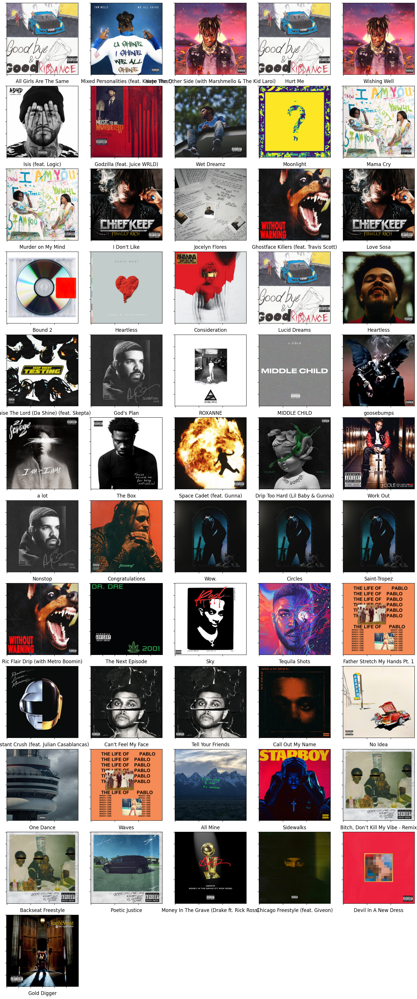

In [65]:
visualize_songs(playlist_rap)

## Creating Playlist Vector

generate a final playlist vector that can be used to compare to songs not present in the playlist.

In [66]:
def generate_playlist_feature(complete_feature_set, playlist_df, weight_factor):
    """ 
    Summarize a user's playlist into a single vector

    Parameters: 
        complete_feature_set (pandas dataframe): Dataframe which includes all of the features for the spotify songs
        playlist_df (pandas dataframe): playlist dataframe
        weight_factor (float): float value that represents the recency bias. The larger the recency bias, the most priority recent songs get. Value should be close to 1. 
        
    Returns: 
        playlist_feature_set_weighted_final (pandas series): single feature that summarizes the playlist
        complete_feature_set_nonplaylist (pandas dataframe): 
    """
    
    complete_feature_set_playlist = complete_feature_set[complete_feature_set['id'].isin(playlist_df['id'].values)]#.drop('id', axis = 1).mean(axis =0)
    complete_feature_set_playlist = complete_feature_set_playlist.merge(playlist_df[['id','date_added']], on = 'id', how = 'inner')
    complete_feature_set_nonplaylist = complete_feature_set[~complete_feature_set['id'].isin(playlist_df['id'].values)]#.drop('id', axis = 1)
    
    playlist_feature_set = complete_feature_set_playlist.sort_values('date_added',ascending=False)

    most_recent_date = playlist_feature_set.iloc[0,-1]
    
    for ix, row in playlist_feature_set.iterrows():
        playlist_feature_set.loc[ix,'months_from_recent'] = int((most_recent_date.to_pydatetime() - row.iloc[-1].to_pydatetime()).days / 30)
        
    playlist_feature_set['weight'] = playlist_feature_set['months_from_recent'].apply(lambda x: weight_factor ** (-x))
    
    playlist_feature_set_weighted = playlist_feature_set.copy()
    #print(playlist_feature_set_weighted.iloc[:,:-4].columns)
    playlist_feature_set_weighted.update(playlist_feature_set_weighted.iloc[:,:-4].mul(playlist_feature_set_weighted.weight,0))
    playlist_feature_set_weighted_final = playlist_feature_set_weighted.iloc[:, :-4]
    #playlist_feature_set_weighted_final['id'] = playlist_feature_set['id']
    
    return playlist_feature_set_weighted_final.sum(axis = 0), complete_feature_set_nonplaylist

In [67]:
complete_feature_set_playlist_vector_rap, complete_feature_set_nonplaylist_rap = generate_playlist_feature(complete_feature_set, playlist_rap, 1.09)

In [68]:
complete_feature_set_playlist_vector_rap.shape

(4901,)

## Generate Recommendations
playlist vector is compared to every song vector using cosine similarity to generate recommendations

In [69]:
def generate_playlist_recos(df, features, nonplaylist_features):
    """ 
    Pull songs from a specific playlist.

    Parameters: 
        df (pandas dataframe): spotify dataframe
        features (pandas series): summarized playlist feature
        nonplaylist_features (pandas dataframe): feature set of songs that are not in the selected playlist
        
    Returns: 
        non_playlist_df_top_40: Top 40 recommendations for that playlist
    """
    
    non_playlist_df = df[df['id'].isin(nonplaylist_features['id'].values)]
    non_playlist_df['sim'] = cosine_similarity(nonplaylist_features.drop('id', axis = 1).values, features.values.reshape(1, -1))[:,0]
    non_playlist_df_top_40 = non_playlist_df.sort_values('sim',ascending = False).head(40)
    non_playlist_df_top_40['url'] = non_playlist_df_top_40['id'].apply(lambda x: sp.track(x)['album']['images'][1]['url'])
    
    return non_playlist_df_top_40

In [70]:
#batch processing 
import numpy as np

def generate_playlist_recos_batch(df, features, nonplaylist_features, batch_size=1000):
    non_playlist_df = df[df['id'].isin(nonplaylist_features['id'].values)]
    non_playlist_df['sim'] = np.zeros(len(non_playlist_df))
    
    for start in range(0, len(nonplaylist_features), batch_size):
        end = min(start + batch_size, len(nonplaylist_features))
        batch = nonplaylist_features.iloc[start:end].drop('id', axis=1).values
        batch_sim = cosine_similarity(batch, features.values.reshape(1, -1))[:,0]
        non_playlist_df['sim'].iloc[start:end] = batch_sim
    
    non_playlist_df_top_40 = non_playlist_df.sort_values('sim', ascending=False).head(40)
    non_playlist_df_top_40['url'] = non_playlist_df_top_40['id'].apply(lambda x: sp.track(x)['album']['images'][1]['url'])
    return non_playlist_df_top_40



In [71]:
#rap_top40 = generate_playlist_recos(spotify_df, complete_feature_set_playlist_vector_rap, complete_feature_set_nonplaylist_rap)
rap_top40 = generate_playlist_recos_batch(spotify_df, complete_feature_set_playlist_vector_rap, complete_feature_set_nonplaylist_rap)

In [72]:
rap_top40

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,...,valence,artists_upd_v1,artists_upd_v2,artists_upd,artists_song,consolidates_genre_lists,year,popularity_red,sim,url
48521,0.00790,"['Trippie Redd', 'Juice WRLD']",0.825,175954,0.572,1,75lcPkAkUsKWHGBlGM476R,0.000000,6,0.1130,...,0.568,"[Trippie Redd, Juice WRLD]",[],"[Trippie Redd, Juice WRLD]",Trippie Redd1400 / 999 Freestyle,"[trap, melodic_rap, rap, chicago_rap]",2018,15,0.804401,https://i.scdn.co/image/ab67616d00001e0292bb80...
521116,0.01140,"['A Boogie Wit da Hoodie', 'Juice WRLD']",0.810,214593,0.550,1,3L19besdNQzd342qL78xqm,0.000006,2,0.1070,...,0.183,"[A Boogie Wit da Hoodie, Juice WRLD]",[],"[A Boogie Wit da Hoodie, Juice WRLD]",A Boogie Wit da HoodieDemons and Angels (feat....,"[trap, pop_rap, chicago_rap, melodic_rap, rap]",2018,14,0.802112,https://i.scdn.co/image/ab67616d00001e02a5c715...
362982,0.32700,"['Future', 'Juice WRLD']",0.736,224507,0.482,1,6gzIcEUuswJQGfJNPYMjjv,0.000000,4,0.2290,...,0.608,"[Future, Juice WRLD]",[],"[Future, Juice WRLD]",FutureHard Work Pays Off,"[trap, southern_hip_hop, pop_rap, chicago_rap,...",2018,14,0.780685,https://i.scdn.co/image/ab67616d00001e02644c51...
362983,0.04840,"['Future', 'Juice WRLD']",0.656,141587,0.542,1,5274I4mUMnYczyeXkGDWZN,0.000000,7,0.1260,...,0.551,"[Future, Juice WRLD]",[],"[Future, Juice WRLD]",FutureFine China,"[trap, southern_hip_hop, pop_rap, chicago_rap,...",2018,15,0.780285,https://i.scdn.co/image/ab67616d00001e02644c51...
362973,0.01170,"['Future', 'Juice WRLD']",0.730,170920,0.465,1,4VMiNOpnjRwSCwmHaUfOMM,0.000000,1,0.2800,...,0.367,"[Future, Juice WRLD]",[],"[Future, Juice WRLD]",FutureRealer N Realer,"[trap, southern_hip_hop, pop_rap, chicago_rap,...",2018,13,0.774523,https://i.scdn.co/image/ab67616d00001e02644c51...
285961,0.29100,"['Juice WRLD', 'Trippie Redd']",0.660,180129,0.760,1,5JAYDuLRkODlVt6dgoalKk,0.000000,2,0.6320,...,0.394,"[Juice WRLD, Trippie Redd]",[],"[Juice WRLD, Trippie Redd]",Juice WRLDTell Me U Luv Me (with Trippie Redd),"[trap, melodic_rap, rap, chicago_rap]",2020,15,0.758676,https://i.scdn.co/image/ab67616d00001e023e0698...
427832,0.07330,"['DJ Khaled', 'Justin Bieber', 'Quavo', 'Chanc...",0.552,260000,0.760,1,5WvAo7DNuPRmk4APhdPzi8,0.000000,0,0.0865,...,0.639,"[DJ Khaled, Justin Bieber, Quavo, Chance the R...",[],"[DJ Khaled, Justin Bieber, Quavo, Chance the R...",DJ KhaledNo Brainer,"[hip_hop, southern_hip_hop, trap, pop_rap, can...",2018,14,0.752980,https://i.scdn.co/image/ab67616d00001e02675b26...
249732,0.01190,"['Lil Tecca', 'Juice WRLD']",0.684,171253,0.671,1,2WsuSYJNXGKXVYkHPnq2yp,0.000000,2,0.0769,...,0.450,"[Lil Tecca, Juice WRLD]",[],"[Lil Tecca, Juice WRLD]",Lil TeccaRansom (with Juice WRLD) - Remix,"[trap, melodic_rap, rap, chicago_rap]",2019,15,0.749889,https://i.scdn.co/image/ab67616d00001e02bd69bb...
521111,0.40700,['A Boogie Wit da Hoodie'],0.791,179449,0.587,1,3Ol2xnObFdKV9pmRD2t9x8,0.000000,3,0.1480,...,0.536,[A Boogie Wit da Hoodie],[],[A Boogie Wit da Hoodie],A Boogie Wit da HoodieLook Back at It,"[trap, melodic_rap, rap, pop_rap]",2018,15,0.739193,https://i.scdn.co/image/ab67616d00001e02a5c715...
48520,0.10900,"['Trippie Redd', 'Juice WRLD', 'YNW Melly']",0.687,199437,0.449,1,7tgjDlQsMR8RvkdlNCJA58,0.000000,2,0.2820,...,0.229,"[Trippie Redd, Juice WRLD, YNW Melly]",[],"[Trippie Redd, Juice WRLD, YNW Melly]",Trippie Redd6 Kiss,"[trap, melodic_rap, rap, chicago_rap]",2019,14,0.738600,https://i.scdn.co/image/ab67616d00001e02cd81b9...


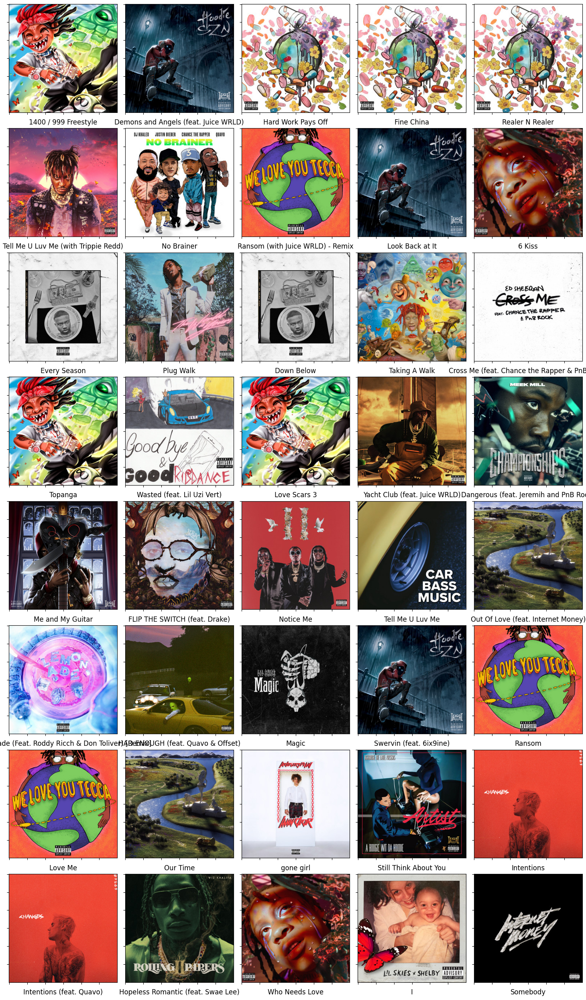

In [73]:
visualize_songs(rap_top40)